In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
plt.rc('figure', max_open_warning = 0)
import sys

In [2]:
database = pd.read_csv("master.csv")
database.dtypes

country                object
year                    int64
sex                    object
age                    object
suicides_no             int64
population              int64
suicides/100k pop     float64
country-year           object
HDI for year          float64
 gdp_for_year ($)      object
gdp_per_capita ($)      int64
generation             object
dtype: object

**Cleaning**

Correcting column names 

In [3]:
database.columns = database.columns.str.strip().str.lower().str.replace(' ', '_')
database = database.rename(columns = {"suicides/100k_pop": "suicide_per_hundred"})

database['age'] = database['age'].str.rstrip('years')

Changing datatype of some columns from object to category

In [4]:
database['gdp_for_year_($)'] = database['gdp_for_year_($)'].str.replace(',', '').astype(int)
database[['age', 'sex', 'generation']] = database[['age', 'sex', 'generation']].astype("category")

Updated datatypes

In [5]:
database.dtypes

country                  object
year                      int64
sex                    category
age                    category
suicides_no               int64
population                int64
suicide_per_hundred     float64
country-year             object
hdi_for_year            float64
gdp_for_year_($)          int64
gdp_per_capita_($)        int64
generation             category
dtype: object

This is how our dataset looks like at this point

In [6]:
database.head()

,country,year,sex,age,suicides_no,population,suicide_per_hundred,country-year,hdi_for_year,gdp_for_year_($),gdp_per_capita_($),generation
0,Albania,1987,male,15-24,21,312900,6.71,Albania1987,NaN,2156624900,796,Generation X
1,Albania,1987,male,35-54,16,308000,5.19,Albania1987,NaN,2156624900,796,Silent
2,Albania,1987,female,15-24,14,289700,4.83,Albania1987,NaN,2156624900,796,Generation X
3,Albania,1987,male,75+,1,21800,4.59,Albania1987,NaN,2156624900,796,G.I. Generation
4,Albania,1987,male,25-34,9,274300,3.28,Albania1987,NaN,2156624900,796,Boomers


Checking how many missing values there are in our dataset and in which columns

In [7]:
database.isnull().sum()

country                    0
year                       0
sex                        0
age                        0
suicides_no                0
population                 0
suicide_per_hundred        0
country-year               0
hdi_for_year           19456
gdp_for_year_($)           0
gdp_per_capita_($)         0
generation                 0
dtype: int64

Only hdi per year has missing values so we decided to lookup for another datset with which we can replace the missing HDI values.

Checking how many countries we have in our dataset

In [8]:
database['country'].nunique()

101

**Phase 1: Exploratory Data Analysis**

Making a dataframe which only contains the following columns of our main dataset:
1. Year
2. Country
3. Suicide per hundred

Initially, we thought of dropping countries which won't show any change/trend over the years etc. However, we later realised that no trend is also a trend. A stable number of suicide is cruicial to conclude any inference with any of the corelating factors.

In [9]:
no_suicide = pd.DataFrame(database, columns = ['year', 'country', 'suicide_per_hundred'])
no_suicide.head()

,year,country,suicide_per_hundred
0,1987,Albania,6.71
1,1987,Albania,5.19
2,1987,Albania,4.83
3,1987,Albania,4.59
4,1987,Albania,3.28


Getting counts for number of years for each country

In [10]:
count_subframe = no_suicide
count_subframe = no_suicide.groupby(['country','year']).suicide_per_hundred.mean().to_frame()
count_subframe = count_subframe.groupby(level = 'country').count()
count_subframe.rename(columns={'suicide_per_hundred':'count'}, inplace=True)

Getting the maximum and minimum year for each country

In [11]:
time_subframe = no_suicide.groupby(['country','year']).suicide_per_hundred.mean().to_frame()
timemin_subframe = time_subframe.reset_index().groupby('country').min().drop(['suicide_per_hundred'], axis = 1) #groupby min
timemax_subframe = time_subframe.reset_index().groupby('country').max().drop(['suicide_per_hundred'], axis = 1) #groupby max

Merging into one dataframe

In [12]:
df_merged = pd.merge(count_subframe, timemin_subframe, on='country', how='outer')
df_merged = pd.merge(df_merged, timemax_subframe, on='country', how='outer')

Renaming duplicate column names

In [13]:
df_merged.rename(columns={'year_x':'year_min','year_y':'year_max'}, inplace=True)

This is how the merged dataframe looks like

In [14]:
df_merged.head(10)

,count,year_min,year_max
country,,,
Albania,22,1987,2010
Antigua and Barbuda,27,1985,2015
Argentina,31,1985,2015
Armenia,25,1990,2016
Aruba,14,1995,2011
Australia,30,1985,2015
Austria,32,1985,2016
Azerbaijan,16,1990,2007
Bahamas,23,1985,2013


Now we are setting threshold values. This allows us to set year range and check if we have enough years worth of data so we can pick countries accordingly.

These are our threshold values:

In [15]:
year_lowerbound = 1985
year_upperbound = 2015
atleast_count = 13

Filtering out our final list of countries

In [16]:
in_range = (df_merged['count'] >= atleast_count) & (df_merged['year_min'] >= year_lowerbound)& (df_merged['year_max'] <= year_upperbound)
df_filtered = df_merged[in_range]
req_countries = df_filtered.index.tolist()

This is our final list of countries

In [17]:
reqCountries = pd.DataFrame({'countries':req_countries})
reqCountries

,countries
0,Albania
1,Antigua and Barbuda
2,Argentina
3,Aruba
4,Australia
5,Azerbaijan
6,Bahamas
7,Bahrain
8,Barbados
9,Belarus


Trimming our original dataset to only include the countries we want to explore

In [18]:
finalDF = pd.DataFrame([])
i = 0
for x in req_countries:
    df = dict()
    df = pd.DataFrame(database.items())
    df = df.transpose()
    df.columns = df.iloc[0]
    df = df.drop(df.index[0])
    finalDF = finalDF.append(database.loc[database['country'].isin([x])] )
    i+=1
database = finalDF
database.head(12)

,country,year,sex,age,suicides_no,population,suicide_per_hundred,country-year,hdi_for_year,gdp_for_year_($),gdp_per_capita_($),generation
0,Albania,1987,male,15-24,21,312900,6.71,Albania1987,NaN,2156624900,796,Generation X
1,Albania,1987,male,35-54,16,308000,5.19,Albania1987,NaN,2156624900,796,Silent
2,Albania,1987,female,15-24,14,289700,4.83,Albania1987,NaN,2156624900,796,Generation X
3,Albania,1987,male,75+,1,21800,4.59,Albania1987,NaN,2156624900,796,G.I. Generation
4,Albania,1987,male,25-34,9,274300,3.28,Albania1987,NaN,2156624900,796,Boomers
5,Albania,1987,female,75+,1,35600,2.81,Albania1987,NaN,2156624900,796,G.I. Generation
6,Albania,1987,female,35-54,6,278800,2.15,Albania1987,NaN,2156624900,796,Silent
7,Albania,1987,female,25-34,4,257200,1.56,Albania1987,NaN,2156624900,796,Boomers
8,Albania,1987,male,55-74,1,137500,0.73,Albania1987,NaN,2156624900,796,G.I. Generation
9,Albania,1987,female,5-14,0,311000,0.00,Albania1987,NaN,2156624900,796,Generation X


Just making sure it was done correctly...

In [19]:
dff = pd.DataFrame({'countries':database.country.unique()})
dff

,countries
0,Albania
1,Antigua and Barbuda
2,Argentina
3,Aruba
4,Australia
5,Azerbaijan
6,Bahamas
7,Bahrain
8,Barbados
9,Belarus


**HDI Processing**

We found another dataset which had the HDI of 195 countries from 1990 to 2017. 
We decided to replace the missing values in our main dataset with the corresponding HDI values from this datset.

In [20]:
HDI = pd.read_csv("HDI2.csv", encoding = "ISO-8859-1")

This is how the HDI dataset initially looked like:

In [21]:
HDI.head()

,Country,1990,Unnamed: 2,1991,Unnamed: 4,1992,Unnamed: 6,1993,Unnamed: 8,1994,...,2013,Unnamed: 48,2014,Unnamed: 50,2015,Unnamed: 52,2016,Unnamed: 54,2017,Unnamed: 56
0,Afghanistan,..,..,..,..,..,..,..,..,..,...,0.487,..,0.491,..,0.493,..,0.494,..,0.498,..
1,Albania,0.645,..,0.626,..,0.61,..,0.613,..,0.619,...,0.771,..,0.773,..,0.776,..,0.782,..,0.785,..
2,Algeria,0.577,..,0.581,..,0.587,..,0.591,..,0.595,...,0.745,..,0.747,..,0.749,..,0.753,..,0.754,..
3,Andorra,..,..,..,..,..,..,..,..,..,...,0.85,..,0.853,..,0.854,..,0.856,..,0.858,..
4,Angola,..,..,..,..,..,..,..,..,..,...,0.554,..,0.564,..,0.572,..,0.577,..,0.581,..


Removing 'Unnamed' from our column names

In [22]:
HDI = HDI[HDI.columns.drop(list(HDI.filter(regex='Unnamed')))]
HDI.head()

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Afghanistan,..,..,..,..,..,..,..,..,..,...,0.437,0.453,0.463,0.471,0.482,0.487,0.491,0.493,0.494,0.498
1,Albania,0.645,0.626,0.61,0.613,0.619,0.632,0.641,0.641,0.652,...,0.724,0.729,0.741,0.752,0.767,0.771,0.773,0.776,0.782,0.785
2,Algeria,0.577,0.581,0.587,0.591,0.595,0.6,0.608,0.617,0.627,...,0.709,0.719,0.729,0.736,0.74,0.745,0.747,0.749,0.753,0.754
3,Andorra,..,..,..,..,..,..,..,..,..,...,0.831,0.83,0.828,0.827,0.849,0.85,0.853,0.854,0.856,0.858
4,Angola,..,..,..,..,..,..,..,..,..,...,0.502,0.522,0.52,0.535,0.543,0.554,0.564,0.572,0.577,0.581


We noticed that the years 1990 to 1999 had a lot of missing values so we decided to limit our 'merging' of dataset to 2000 till 2017.

Dropping all columns of years before 2000

In [23]:
HDI = HDI[HDI.columns.drop(list(HDI.filter(regex='19')))]

This is how our HDI dataset looked like after doing so

In [24]:
HDI.head()

,Country,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,Afghanistan,..,..,0.373,0.383,0.398,0.408,0.417,0.429,0.437,0.453,0.463,0.471,0.482,0.487,0.491,0.493,0.494,0.498
1,Albania,0.669,0.676,0.682,0.689,0.694,0.704,0.711,0.72,0.724,0.729,0.741,0.752,0.767,0.771,0.773,0.776,0.782,0.785
2,Algeria,0.644,0.653,0.664,0.674,0.684,0.692,0.698,0.707,0.709,0.719,0.729,0.736,0.74,0.745,0.747,0.749,0.753,0.754
3,Andorra,0.759,0.767,0.78,0.82,0.826,0.819,0.829,0.829,0.831,0.83,0.828,0.827,0.849,0.85,0.853,0.854,0.856,0.858
4,Angola,0.387,0.401,0.418,0.429,0.442,0.455,0.471,0.492,0.502,0.522,0.52,0.535,0.543,0.554,0.564,0.572,0.577,0.581


Then we then decided to see which countries have '..' in their rows. There are 23 such countries.

In [25]:
temp = HDI[HDI.values  == ".."]
temp = temp.drop_duplicates()
temp.shape

(23, 19)

Dropping all such countries

In [26]:
for co in temp['Country']:
    i = HDI[(HDI.Country == co)].index
    HDI = HDI.drop(i)
HDI.shape

(172, 19)

Making a list of all the unqiue values in our main dataset (the updated one)

In [27]:
reqCountries = database['country'].unique()
reqCountries

array(['Albania', 'Antigua and Barbuda', 'Argentina', 'Aruba',
       'Australia', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Brazil', 'Bulgaria', 'Canada',
       'Chile', 'Colombia', 'Costa Rica', 'Cuba', 'Denmark', 'Ecuador',
       'El Salvador', 'Estonia', 'Finland', 'France', 'Georgia',
       'Germany', 'Greece', 'Guatemala', 'Guyana', 'Ireland', 'Israel',
       'Italy', 'Jamaica', 'Japan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan',
       'Latvia', 'Luxembourg', 'Malta', 'Mexico', 'New Zealand', 'Norway',
       'Panama', 'Paraguay', 'Philippines', 'Poland', 'Portugal',
       'Puerto Rico', 'Republic of Korea', 'Russian Federation',
       'Saint Lucia', 'Saint Vincent and Grenadines', 'Serbia',
       'Seychelles', 'Singapore', 'Slovakia', 'Slovenia', 'South Africa',
       'Spain', 'Suriname', 'Switzerland', 'Trinidad and Tobago',
       'Turkmenistan', 'Ukraine', 'United Kingdom', 'United States',
       'Uruguay', 'Uzbekistan'], dty

Figuring out how many countries are present in both our HDI dataset and our main suicide rate dataset

In [28]:
count = 0
for i in HDI['Country']:
    for name in reqCountries:
        if name== i:
            count += 1
print(count)

63


Dropping all countries which are in the HDI dataset but not in our suicide rate dataset

In [29]:
HDI = HDI[HDI['Country'].isin(reqCountries)]
HDI.shape

(63, 19)

There are 63 common countries between the two datsets so now we will be merging those but since our suicide rate dataset is from the year 1985 to 2014 and our HDI data is from the year 2000 to 2017 after all the cleaning, the common years would be 2000 to 2014.

Reducing our data sets

Our thresholds would be the following:

In [30]:
year_lowerbound = 2000
year_upperbound = 2014

Filtering out our suicide rate dataset

In [31]:
in_range = (database['year'] >= year_lowerbound)& (database['year'] <= year_upperbound)
UpdatedDatabase = database[in_range]
UpdatedDatabase

,country,year,sex,age,suicides_no,population,suicide_per_hundred,country-year,hdi_for_year,gdp_for_year_($),gdp_per_capita_($),generation
132,Albania,2000,male,25-34,17,232000,7.33,Albania2000,0.656,3632043908,1299,Generation X
133,Albania,2000,male,55-74,10,177400,5.64,Albania2000,0.656,3632043908,1299,Silent
134,Albania,2000,female,75+,2,37800,5.29,Albania2000,0.656,3632043908,1299,G.I. Generation
135,Albania,2000,male,75+,1,24900,4.02,Albania2000,0.656,3632043908,1299,G.I. Generation
136,Albania,2000,female,15-24,6,263900,2.27,Albania2000,0.656,3632043908,1299,Generation X
137,Albania,2000,male,15-24,5,240000,2.08,Albania2000,0.656,3632043908,1299,Generation X
138,Albania,2000,female,35-54,5,332200,1.51,Albania2000,0.656,3632043908,1299,Boomers
139,Albania,2000,female,25-34,3,245800,1.22,Albania2000,0.656,3632043908,1299,Generation X
140,Albania,2000,male,35-54,4,374700,1.07,Albania2000,0.656,3632043908,1299,Boomers
141,Albania,2000,male,5-14,1,374900,0.27,Albania2000,0.656,3632043908,1299,Millenials


Filtering out our HDI dataset

In [32]:
HDI = HDI.drop(columns = ['2015','2016','2017'])
HDI.head()

,Country,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014
1,Albania,0.669,0.676,0.682,0.689,0.694,0.704,0.711,0.72,0.724,0.729,0.741,0.752,0.767,0.771,0.773
6,Argentina,0.771,0.776,0.769,0.775,0.78,0.782,0.787,0.792,0.795,0.799,0.813,0.819,0.818,0.82,0.82
8,Australia,0.898,0.9,0.903,0.904,0.907,0.908,0.911,0.915,0.92,0.921,0.923,0.925,0.929,0.931,0.933
10,Azerbaijan,0.64,0.648,0.657,0.666,0.674,0.679,0.704,0.709,0.719,0.736,0.74,0.741,0.745,0.752,0.758
11,Bahamas,0.776,0.779,0.781,0.782,0.784,0.786,0.788,0.789,0.79,0.787,0.789,0.793,0.807,0.807,0.807


Extracting the relevant information to make country-wise plots of HDI with respect to suicide rates.

In [33]:
databaseYearlySuicideRate = UpdatedDatabase.drop(columns = ['suicide_per_hundred', 'hdi_for_year', 'gdp_for_year_($)', 'gdp_per_capita_($)' ])
databaseYearlySuicideRate = databaseYearlySuicideRate.groupby(['country', 'year']).sum()
databaseYearlySuicideRate['suicide_per_hundred'] = databaseYearlySuicideRate['suicides_no']*100000/databaseYearlySuicideRate['population']
databaseYearlySuicideRate.head(90)

suicides_no  population  suicide_per_hundred
country             year                                              
Albania             2000           54     2796300             1.931123
                    2001          119     2799349             4.250988
                    2002          133     2818839             4.718255
                    2003          124     2843929             4.360165
                    2004          146     2874991             5.078277
                    2005            0     2783320             0.000000
                    2006            0     2780176             0.000000
                    2007          124     2770344             4.475978
                    2008          160     2757059             5.803285
                    2009            0     2745735             0.000000
                    2010           96     2736025             3.508740
Antigua and Barbuda 2000            2       75326             2.655126
                    2001            2       76497             2.614482
                    2002            0       77588             0.000000
                    2003            1       78658             1.271327
                    2004            2       79722             2.508718
                    2005            0       80809             0.000000
                    2006            0       81973             0.000000
                    2007            1       83131             1.202921
                    2008            0       84273             0.000000
                    2009            0       85405             0.000000
                    2012            0       88703             0.000000
                    2013            0       89779             0.000000
                    2014            0       90837             0.000000
Argentina           2000         2774    33585533             8.259509
                    2001         3132    34010946             9.208800
                    2002         3162    34407507             9.189855
                    2003         3289    34785907             9.454978
                    2004         3121    35162945             8.875821
                    2005         3058    35550617             8.601820
...                               ...         ...                  ...
Australia           2010         2420    20847547            11.608080
                    2011         2392    20881910            11.454891
                    2012         2580    21238909            12.147517
                    2013         2608    21600180            12.073973
                    2014         2891    21927587            13.184305
Azerbaijan          2000           62     7415250             0.836115
                    2001          317     7518000             4.216547
                    2002           92     7605700             1.209619
                    2003          129     7674400             1.680913
                    2004          108     7738250             1.395664
                    2007           55     7921100             0.694348
Bahamas             2000           11      269738             4.078031
                    2001            1      276140             0.362135
                    2002            3      282555             1.061740
                    2003            1      288888             0.346155
                    2004            2      295237             0.677422
                    2005            4      301763             1.325544
                    2006            2      308499             0.648300
                    2007            5      314989             1.587357
                    2008            4      321447             1.244373
                    2009            6      327813             1.830312
                    2010           10      333869             2.995187
                    2011            4      338383             1.182092
                    2012            5      343558 

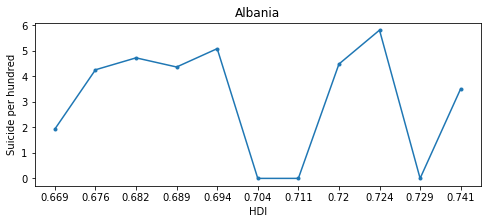

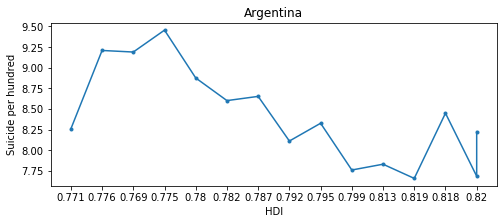

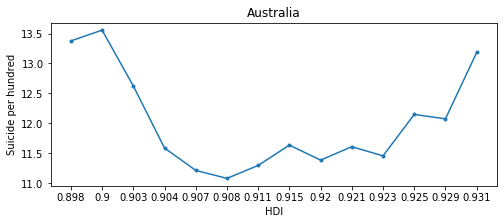

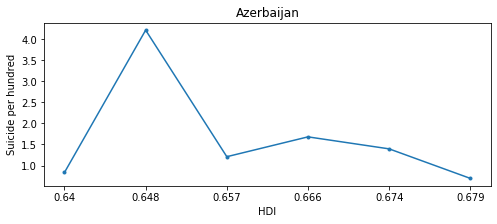

In [34]:
count = 0
HDITemp = HDI

for index, row in HDITemp.iterrows():
    countryName = row[0]
    listOfSuicideRates = []
    listOfYears = []
    for index2, row2 in databaseYearlySuicideRate.iterrows(): 
        if index2[0] == countryName:
            listOfSuicideRates.append(row2['suicide_per_hundred'])
            listOfYears.append(index2[1])
    listOfHDI = []
    if count == 4:
        break
    first = 0
    for x in row:
        if first == len(listOfYears) + 1:
            break
        elif first != 0:
            listOfHDI.append(x)
        first +=1
    fig = plt.figure(figsize=(8,3))
    plt.plot(listOfHDI,listOfSuicideRates, marker=".")
    plt.xlabel('HDI')
    plt.title(countryName)
    plt.ylabel('Suicide per hundred')
    plt.show()
    count += 1

**Looking at Worldwide Trends**

**Plotting the worldwide trend of suicide rate over the years**

Extracting the relevant columns only and grouping by year to get an yearly dataframe. We are also summing up the suicide numbers and population. We need to calculate a new suicide rate based on the summation value of these.

In [35]:
databaseYearlySuicideRate = database.drop(columns = ['country', 'hdi_for_year', 'suicide_per_hundred', 'gdp_for_year_($)', 'gdp_per_capita_($)'])
databaseYearlySuicideRate = databaseYearlySuicideRate.groupby('year').sum()
databaseYearlySuicideRate['suicide_rate'] = databaseYearlySuicideRate['suicides_no']*100000/databaseYearlySuicideRate['population']
databaseYearlySuicideRate.head()

,suicides_no,population,suicide_rate
year,,,
1985,103547,926455953,11.176678
1986,108719,946541699,11.485918
1987,118405,1016700410,11.646007
1988,115856,1023921914,11.314925
1989,152548,1173851376,12.995512


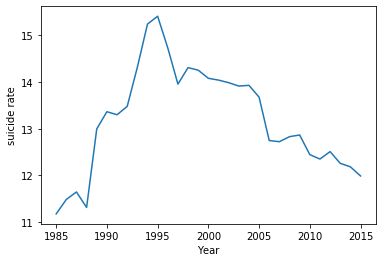

In [36]:
plt.plot(databaseYearlySuicideRate['suicide_rate'])
plt.xlabel('Year')
plt.ylabel('suicide rate')
plt.show()

**Plotting the worldwide trend of suicide rate over the years for both male and females**

Extracting the relevant columns only (females data) and grouping by year to get an yearly dataframe. We are also summing up the suicide numbers and population. We need to calculate a new suicide rate based on the summation value of these.

In [37]:
databaseYearlySuicideRate = database.drop(columns = ['country', 'hdi_for_year', 'suicide_per_hundred', 'gdp_for_year_($)', 'gdp_per_capita_($)'])
databaseYearlySuicideRateFemale = databaseYearlySuicideRate[databaseYearlySuicideRate['sex'] == 'female']
databaseYearlySuicideRateFemale = databaseYearlySuicideRateFemale.groupby('year').sum()
databaseYearlySuicideRateFemale['suicide_rate'] = databaseYearlySuicideRateFemale['suicides_no']*100000/databaseYearlySuicideRateFemale['population']
databaseYearlySuicideRateFemale.head()

,suicides_no,population,suicide_rate
year,,,
1985,28252,471654908,5.989973
1986,30083,482457676,6.235366
1987,32050,519455702,6.169920
1988,31374,523352799,5.994809
1989,39066,603285479,6.475541


Extracting the relevant columns only (males data) and grouping by year to get an yearly dataframe. We are also summing up the suicide numbers and population. We need to calculate a new suicide rate based on the summation value of these.

In [38]:
databaseYearlySuicideRate = database.drop(columns = ['country', 'hdi_for_year', 'suicide_per_hundred', 'gdp_for_year_($)', 'gdp_per_capita_($)'])
databaseYearlySuicideRateMale = databaseYearlySuicideRate[databaseYearlySuicideRate['sex'] == 'male']
databaseYearlySuicideRateMale = databaseYearlySuicideRateMale.groupby('year').sum()
databaseYearlySuicideRateMale['suicide_rate'] = databaseYearlySuicideRateMale['suicides_no']*100000/databaseYearlySuicideRateMale['population']
databaseYearlySuicideRateMale.head()

,suicides_no,population,suicide_rate
year,,,
1985,75295,454801045,16.555591
1986,78636,464084023,16.944345
1987,86355,497244708,17.366701
1988,84482,500569115,16.877190
1989,113482,570565897,19.889377


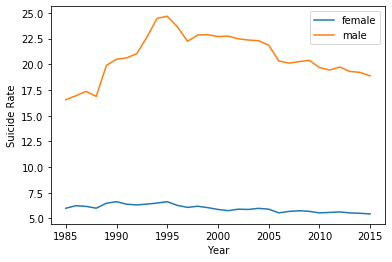

In [40]:
fig, ax = plt.subplots()
plt.plot(databaseYearlySuicideRateFemale['suicide_rate'] , label = 'female')
plt.plot(databaseYearlySuicideRateMale['suicide_rate'] , label = 'male')
plt.xlabel('Year')
plt.ylabel('Suicide Rate')
h,labels = ax.get_legend_handles_labels()
labels[:2] = ['female','male']
ax.legend(labels=labels)
plt.show()

Plotting the population of males and females over the years to see if such a huge difference in suicide rates was due to larger number of males than females. As we can see from the plot, this is not the reason.

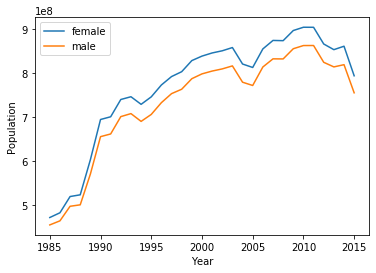

In [41]:
fig, ax = plt.subplots()
plt.plot(databaseYearlySuicideRateFemale['population'] , label = 'female')
plt.plot(databaseYearlySuicideRateMale['population'] , label = 'male')
plt.xlabel('Year')
plt.ylabel('Population')
h,labels = ax.get_legend_handles_labels()
labels[:2] = ['female','male']
ax.legend(labels=labels)
plt.show()

**Making Bar chart to show trend of suicide rate in different generations accross the world**

Extracting the relevant columns only and grouping by generation to get a generation-wise dataframe. We are also summing up the suicide numbers and population. We need to calculate a new suicide rate based on the summation value of these.

In [42]:
databaseYearlySuicideRate = database.drop(columns = ['country','year', 'hdi_for_year', 'suicide_per_hundred', 'gdp_for_year_($)', 'gdp_per_capita_($)'])
databaseYearlySuicideRateGeneration = databaseYearlySuicideRate.groupby('generation').sum()
databaseYearlySuicideRateGeneration['suicide_rate'] = databaseYearlySuicideRateGeneration['suicides_no']*100000/databaseYearlySuicideRateGeneration['population']
databaseYearlySuicideRateGeneration

,suicides_no,population,suicide_rate
generation,,,
Boomers,2089154,12139504918,17.209549
G.I. Generation,475220,1992070174,23.855585
Generation X,1387437,12139580902,11.429035
Generation Z,14826,2237510764,0.662611
Millenials,577205,9622859645,5.998269
Silent,1640377,8460076034,19.389625


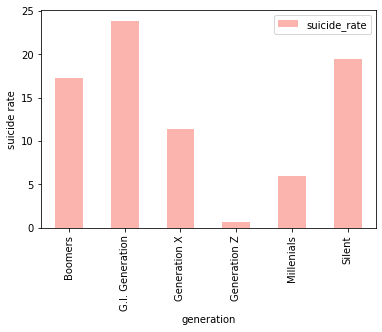

In [43]:
databaseYearlySuicideRateGeneration['suicide_rate'].plot(kind = 'bar', legend = True, colormap = 'Pastel1')
plt.ylabel('suicide rate')
plt.show()

**Plotting the worldwide trend of different age groups over the years**

Extracting the relevant columns only and grouping by age group and year to get an year-wise age group specific dataframe. We are also summing up the suicide numbers and population. We need to calculate a new suicide rate based on the summation value of these.

In [44]:
databaseYearlySuicideRate = database.drop(columns = ['country', 'hdi_for_year', 'suicide_per_hundred', 'gdp_for_year_($)', 'gdp_per_capita_($)'])
databaseYearlySuicideRateAge1 = databaseYearlySuicideRate.groupby(['age','year']).sum()
databaseYearlySuicideRateAge1['suicide_rate'] = databaseYearlySuicideRateAge1['suicides_no']*100000/databaseYearlySuicideRateAge1['population']
databaseYearlySuicideRateAge1.head()

suicides_no  population  suicide_rate
age    year                                       
15-24  1985        13852   178326911      7.767756
       1986        14491   180381320      8.033537
       1987        14695   191784025      7.662265
       1988        14814   190922545      7.759167
       1989        17788   211168052      8.423623

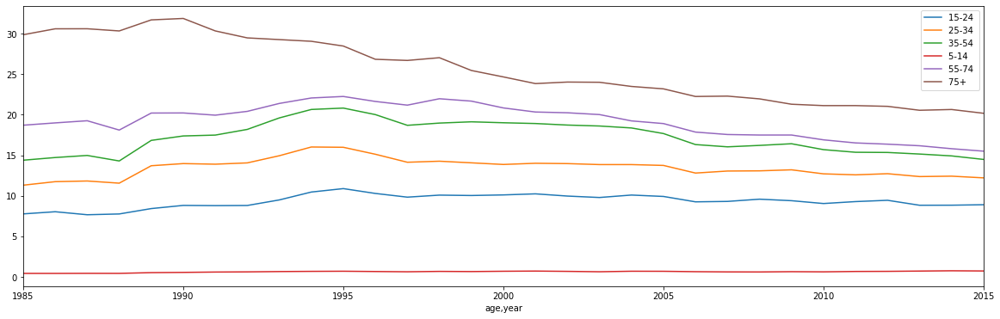

In [71]:
fig, ax = plt.subplots(figsize=(20,6))
bp = databaseYearlySuicideRateAge1.groupby('age')
bp = bp['suicide_rate'].plot(kind='line', ax=ax)
h,labels = ax.get_legend_handles_labels()
ax.legend(labels = labels)
a=ax.get_xticks().tolist()
a[0]='1985'
a[1]='1990'
a[2]='1995'
a[3]='2000'
a[4]='2005'
a[5]='2010'
a[6]='2015'
ax.set_xticklabels(a)
plt.show()

**Looking at Country-wise Trends**

**Plotting the country-wise trend of suicide rate over the years**

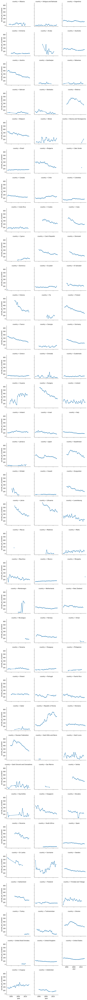

In [46]:
g = sns.FacetGrid(no_suicide.groupby(['country','year']).suicide_per_hundred.sum().reset_index(), col="country", col_wrap=3)
g = g.map(plt.plot, "year", "suicide_per_hundred", marker=".")

**Making a bar chart to show the country-wise trend of suicide rate over the years for both male and females**

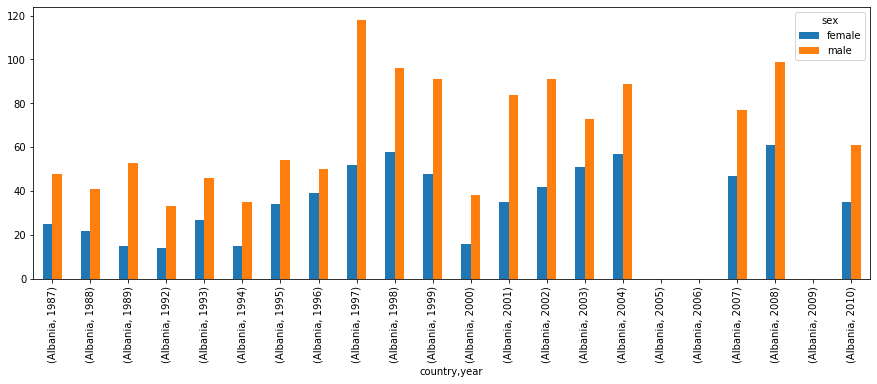

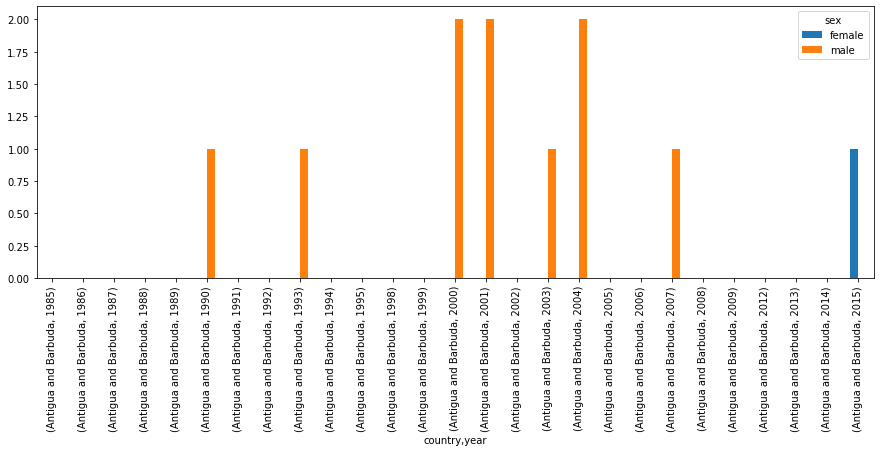

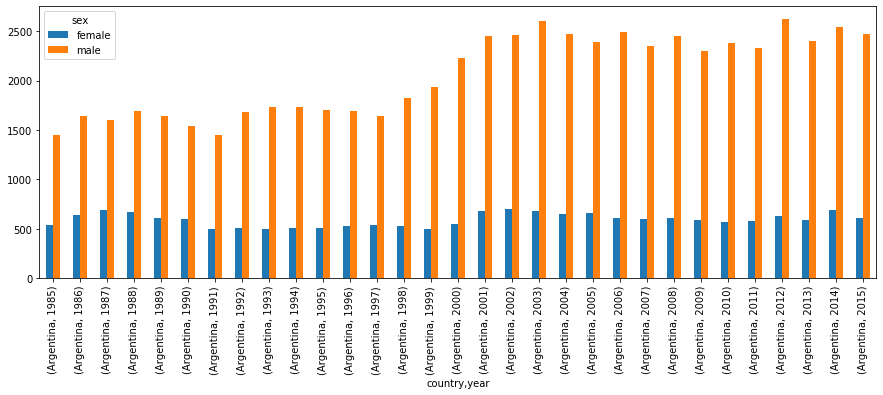

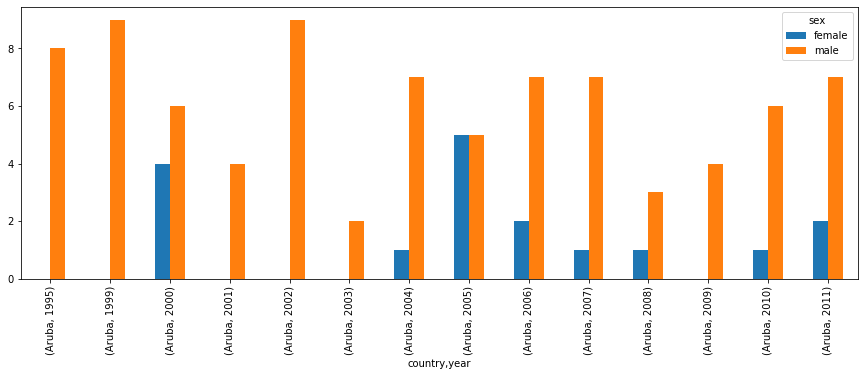

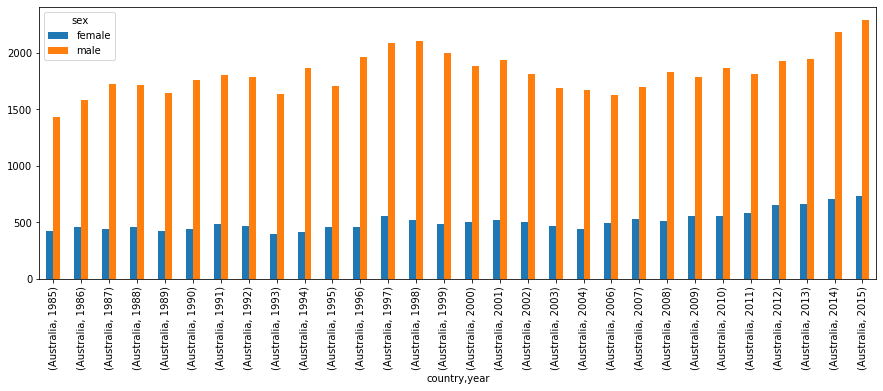

...

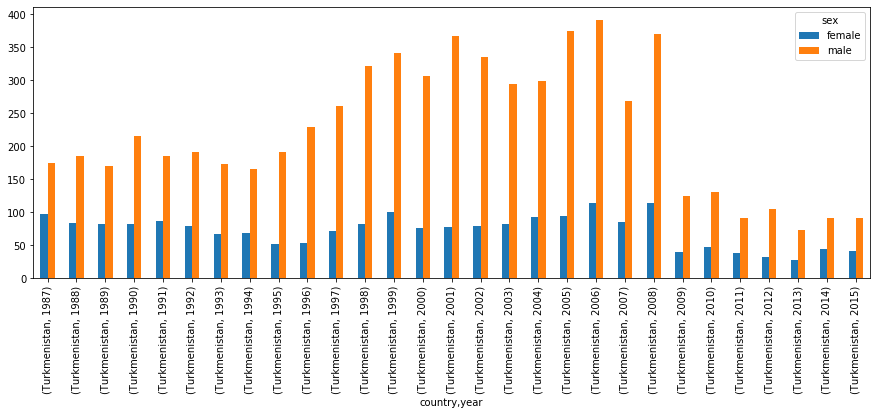

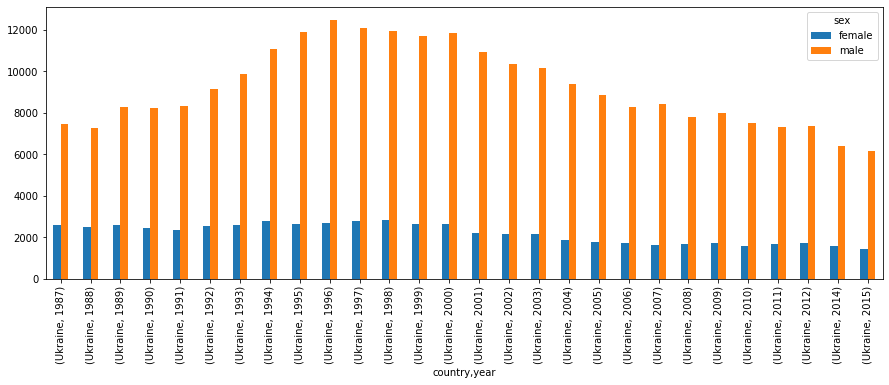

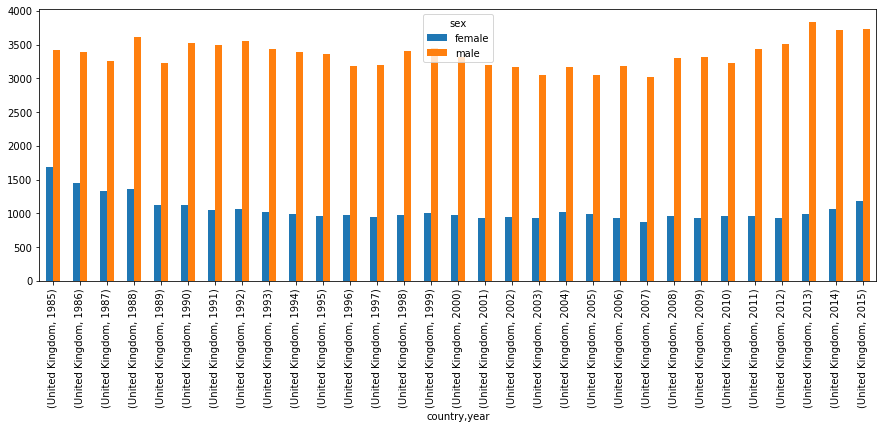

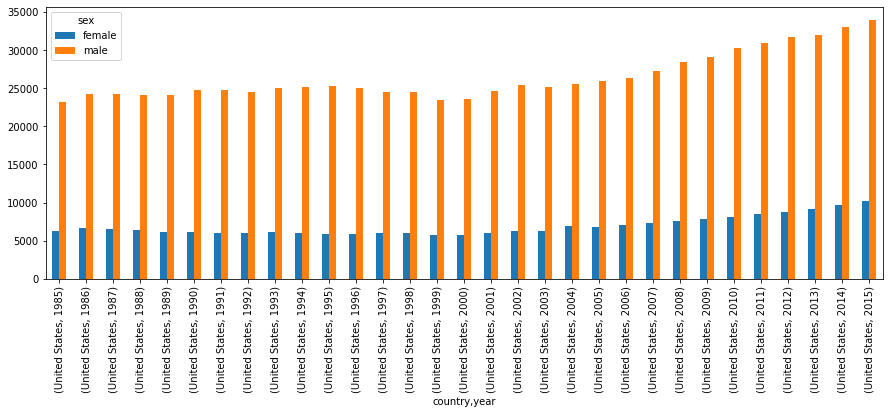

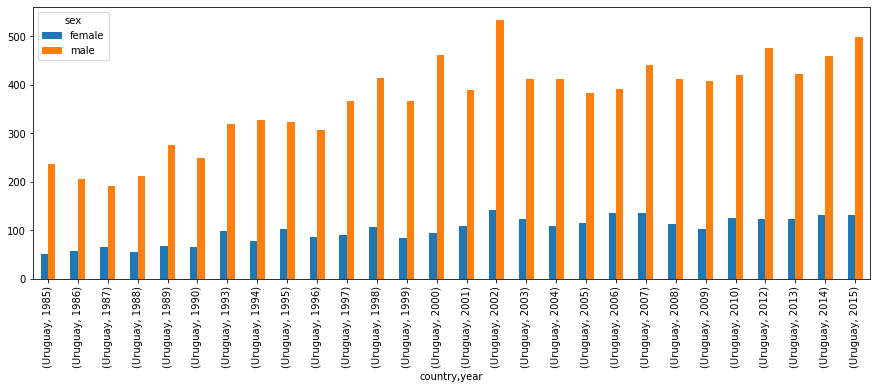

In [47]:
db = database['suicides_no'].groupby([database['country'],database['year'],database['sex']]).sum().unstack(fill_value  = 0)
k = db['female'].count()
prev = 'Albania'
starting = 0
ending = 0
for i in range(k):
    if prev != db.index[i][0]:
        db2 = db.iloc[starting:ending]
        db2.plot.bar(figsize=(15,5))
        plt.show()
        starting = ending
    ending += 1
    prev = db.index[i][0]

**Making a bar chart to show the country-wise trend of suicide rate of different generations over different age groups**

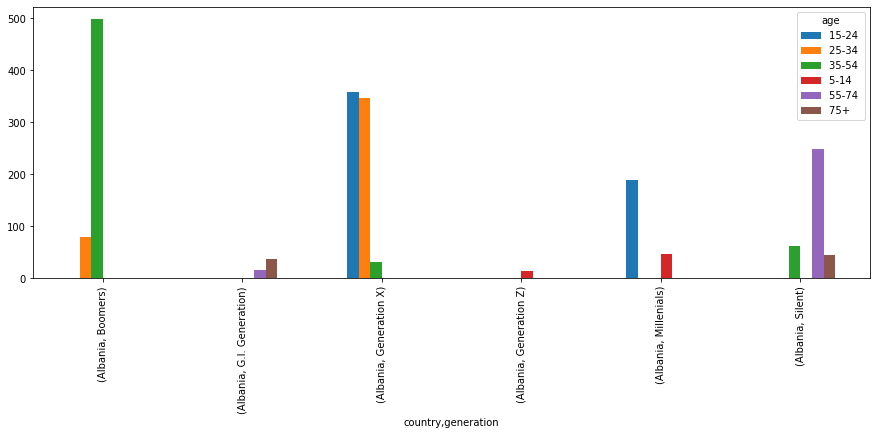

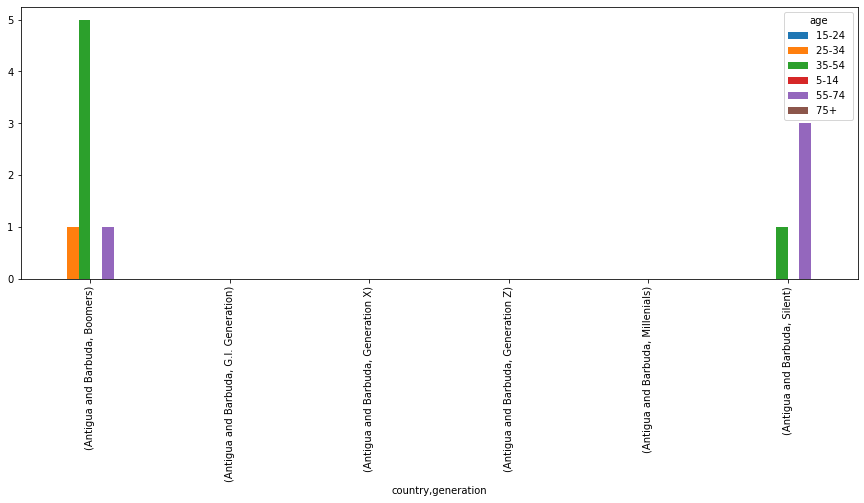

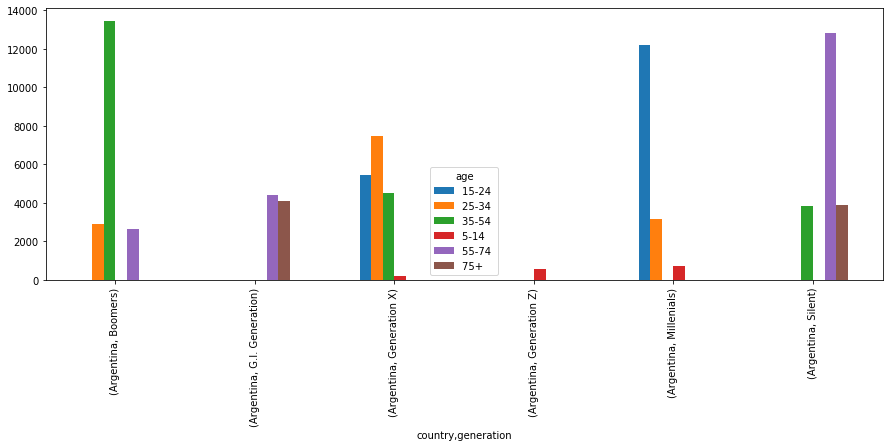

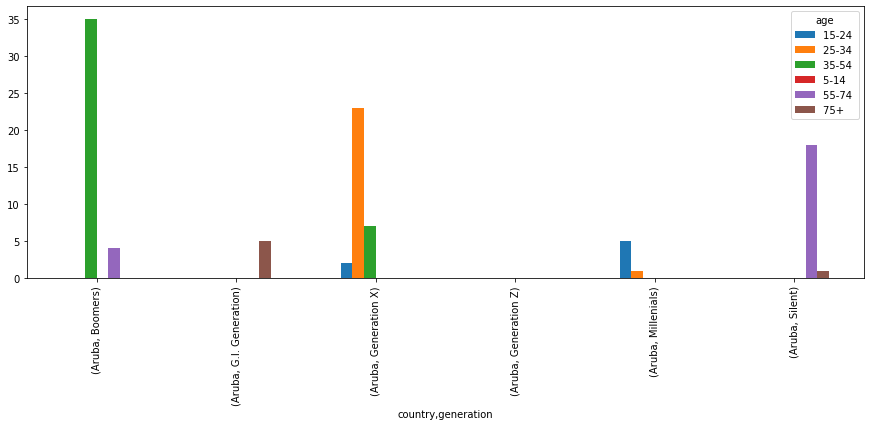

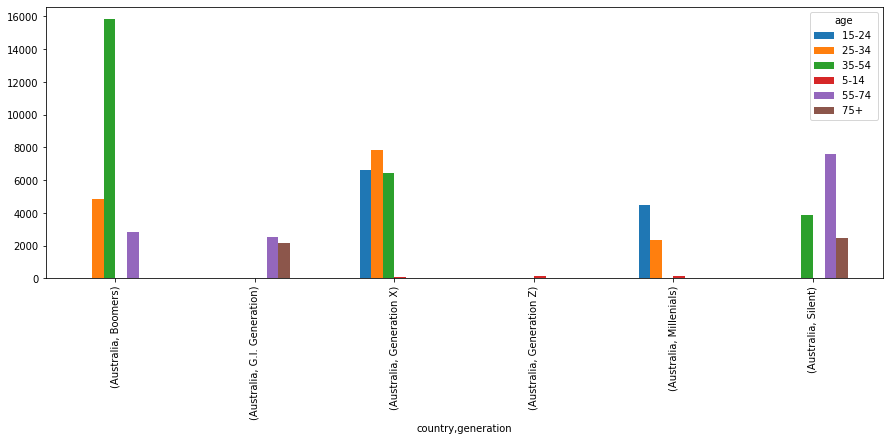

...

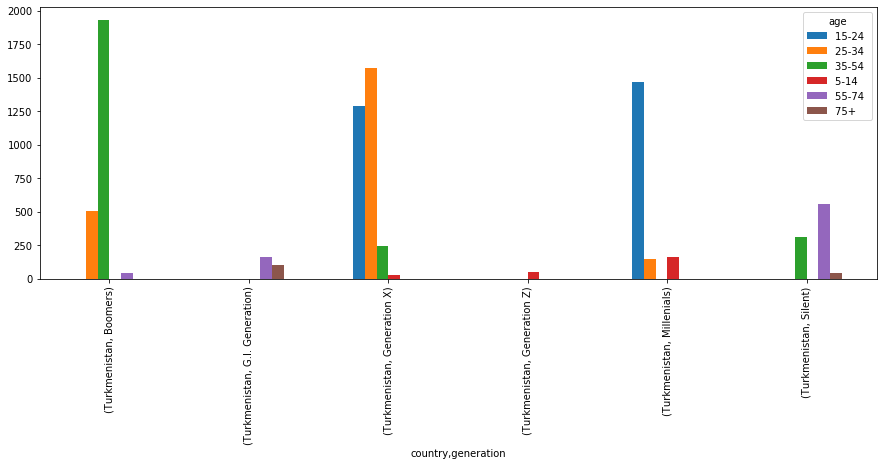

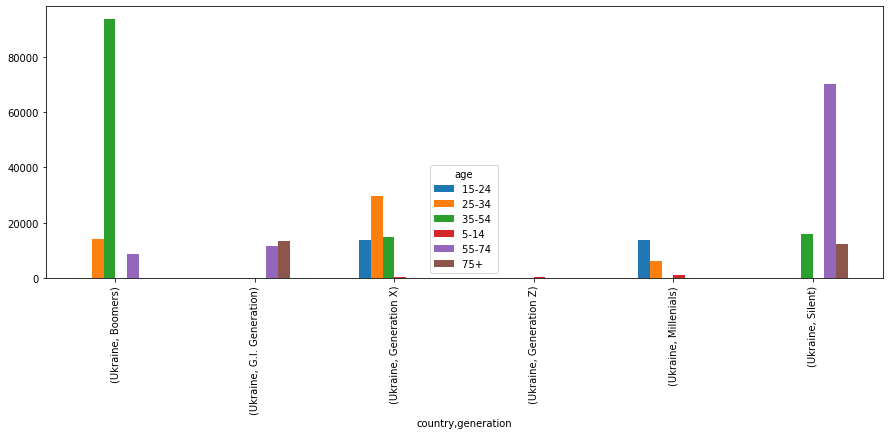

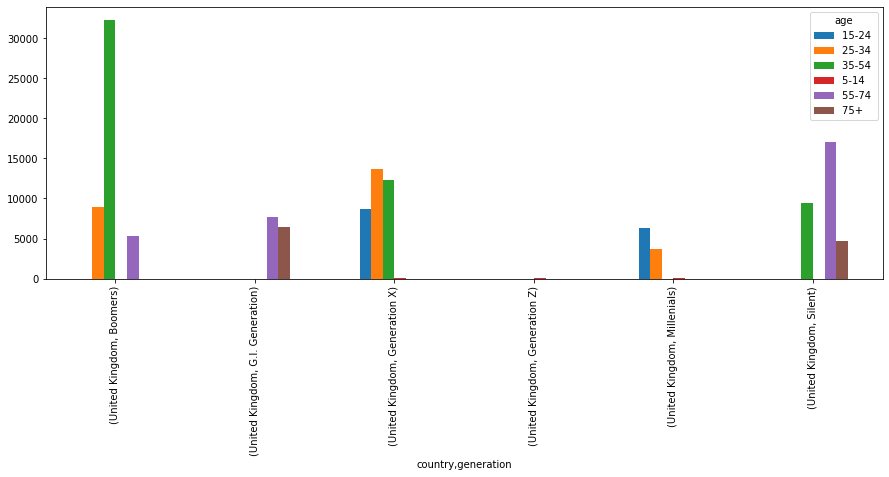

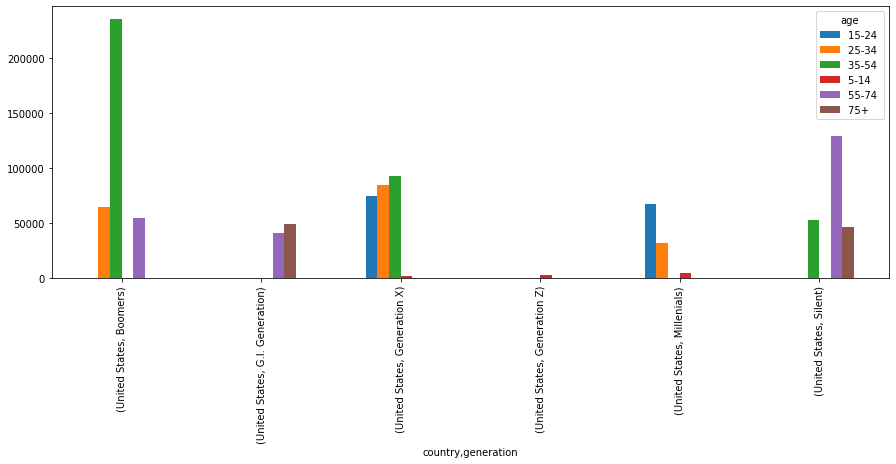

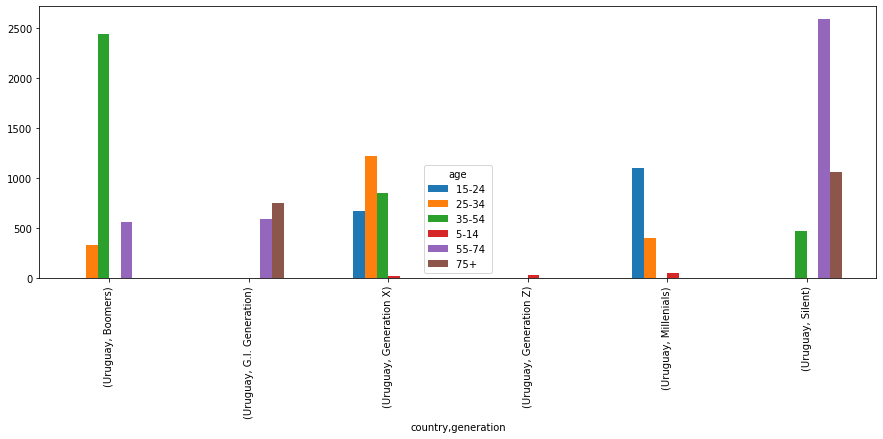

In [48]:
db = database['suicides_no'].groupby([database['country'],database['generation'],database['age']]).sum().unstack(fill_value  = 0)
k = db.count()
k = k[0]
prev = 'Albania'
starting = 0
ending = 0
for i in range(k):
    if prev != db.index[i][0]:
        db2 = db.iloc[starting:ending]
        db2.plot.bar(figsize=(15,5))
        plt.show()
        starting = ending
    ending += 1
    prev = db.index[i][0]

**Plotting the country-wise trend of suicide rate and GDP over the years side by side**

Making a GDP dataframe

In [49]:
GDP = pd.DataFrame(database, columns = ['year', 'country', 'gdp_for_year_($)'])
GDP = GDP.drop_duplicates(subset ="gdp_for_year_($)", keep = 'first')#.groupby(['country', 'year'])

Grouping based on country and year

In [50]:
sum_no_suicides = []

what= database['suicide_per_hundred'].groupby([database['country'],database['year']]).sum()

for num in what:
    sum_no_suicides.append(num)

Combining it all into one dataframe

In [51]:
combined = {'country': GDP['country'], 'year': GDP['year'], 'gdp_for_year_($)': GDP['gdp_for_year_($)'], 'sum_no_suicide': sum_no_suicides}
comprehensive = pd.DataFrame(combined)
comprehensive.head()

,country,year,gdp_for_year_($),sum_no_suicide
0,Albania,1987,2156624900,31.85
12,Albania,1988,2126000000,32.46
24,Albania,1989,2335124988,33.40
36,Albania,1992,709452584,18.00
48,Albania,1993,1228071038,32.56


Plotting them seperately

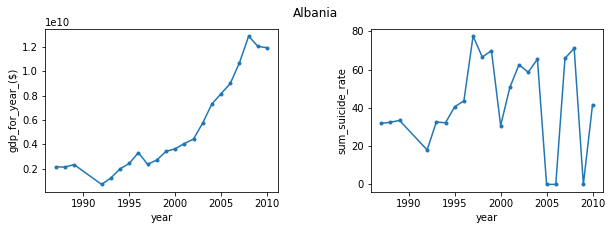

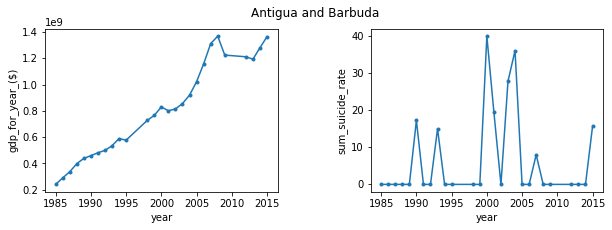

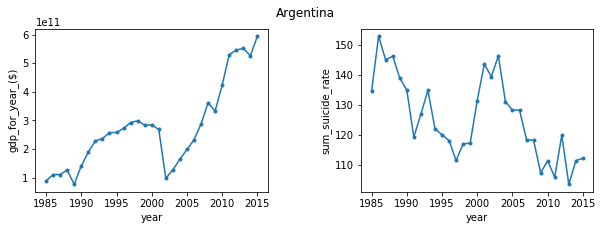

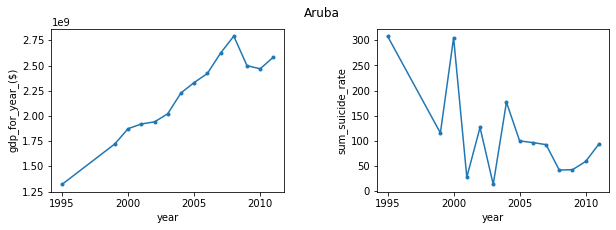

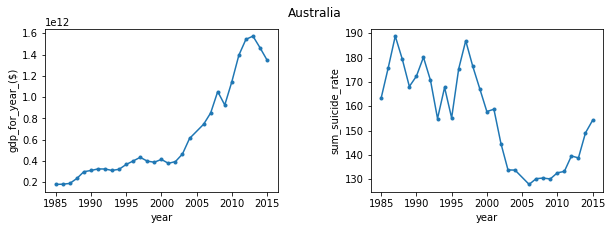

...

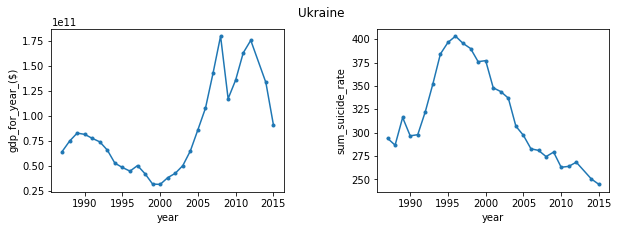

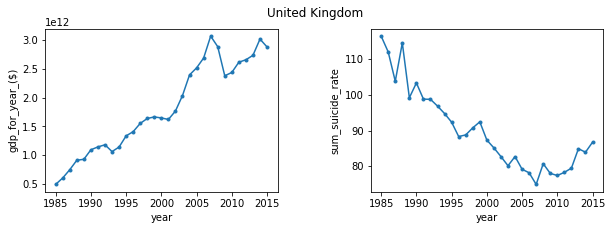

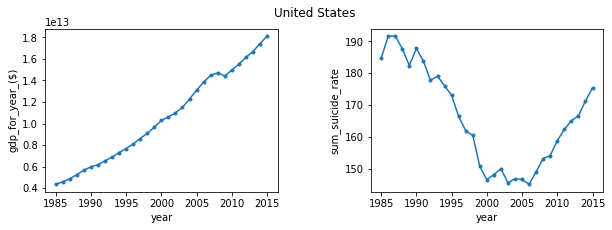

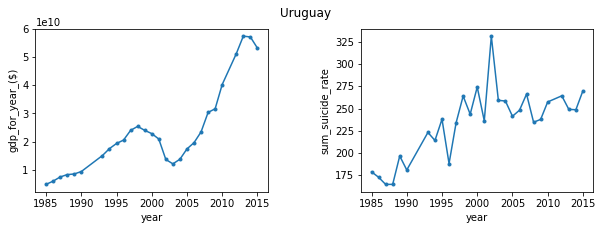

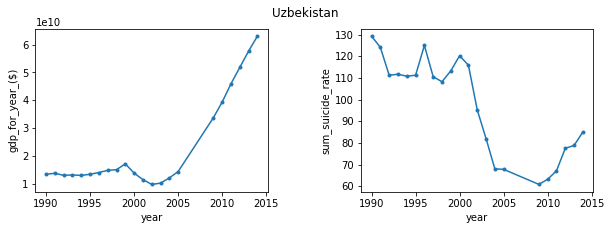

In [52]:
grouped = comprehensive.groupby('country')

for name,group in grouped:
    fig = plt.figure(figsize=(10,3))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    ax1 = fig.add_subplot(121)
    plt.plot(group['year'], group['gdp_for_year_($)'], marker=".", label = name)
    fig.suptitle(name)
    plt.xlabel('year')
    plt.ylabel('gdp_for_year_($)')
    ax3 = fig.add_subplot(122)
    plt.plot(group['year'], group['sum_no_suicide'], marker=".", label = name)
    plt.xlabel('year')
    plt.ylabel('sum_suicide_rate')

Plotting them together to see if there is any correlation

Looking at these trends, it is quite clear that we can't ascribe GDP as the only factor. Initially, we thought that a higher GDP would most likely result in a descreased in suicide rate as GDP is one measure of what the current state of the country is. 

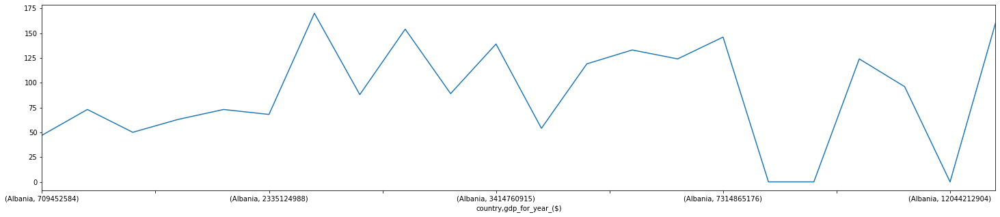

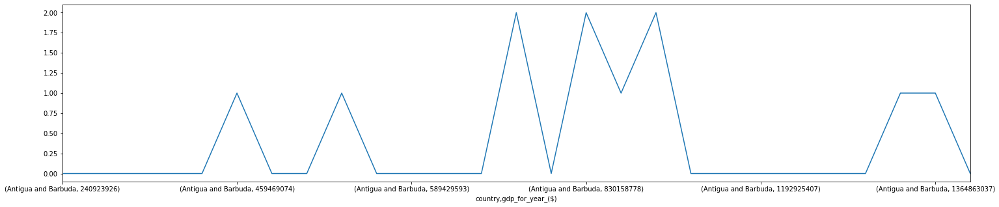

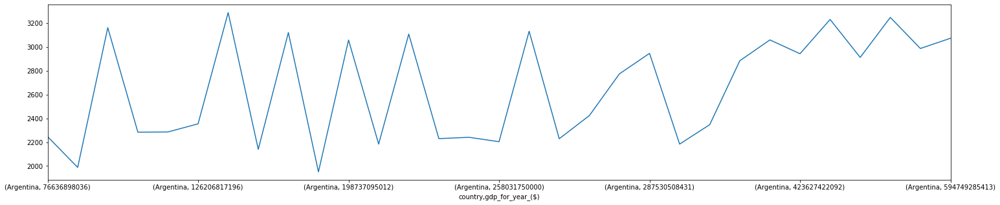

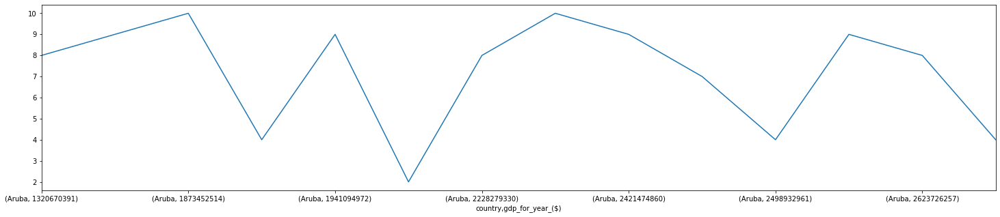

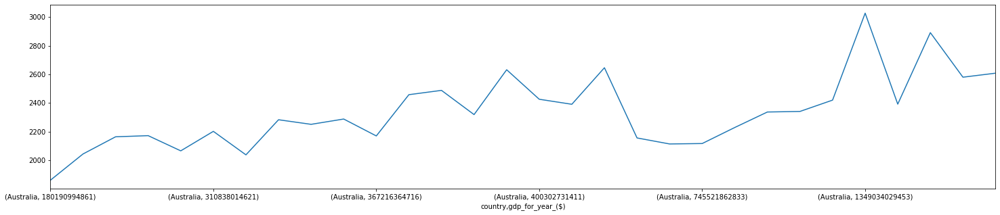

...

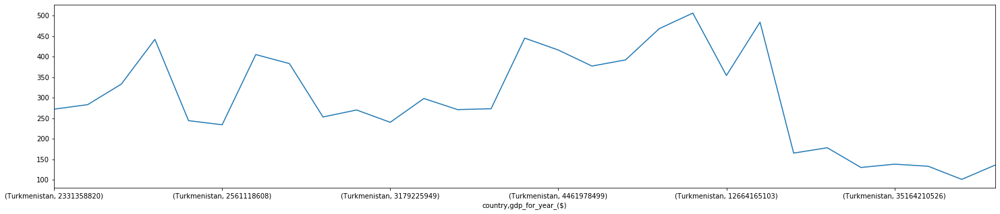

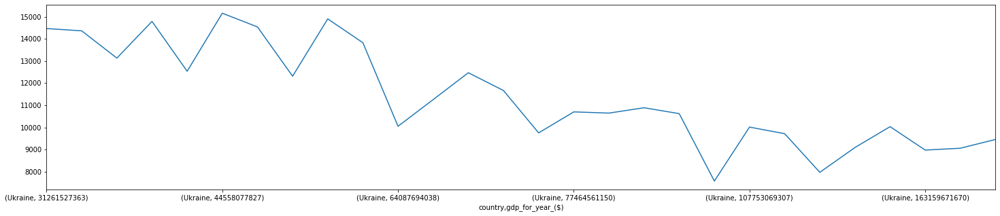

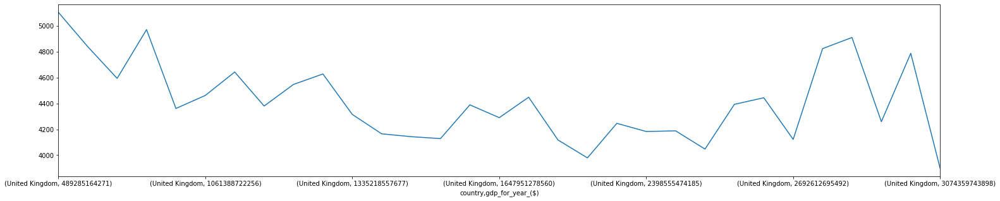

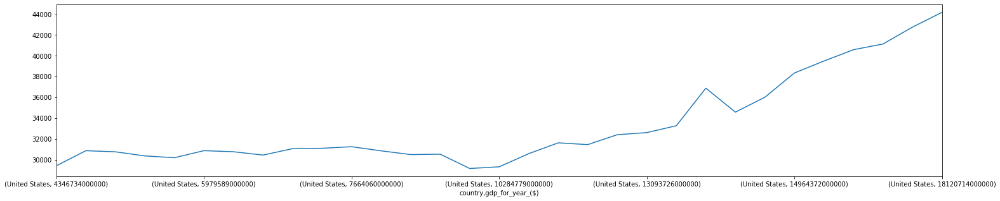

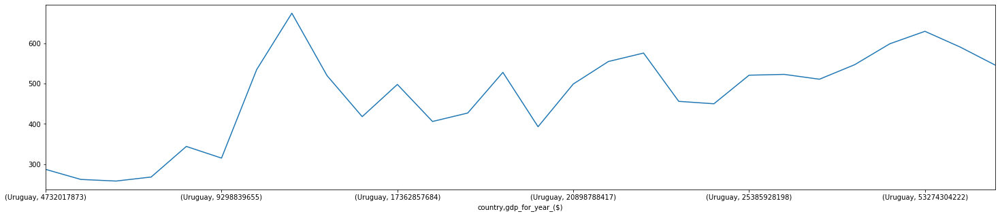

In [56]:
db = database.sort_values('gdp_for_year_($)')
db = db['suicides_no'].groupby([db['country'], db['gdp_for_year_($)']]).sum()
k = db.count()
k
prev = 'Albania'
starting = 0
ending = 0
for i in range(k):
    if prev != db.index[i][0]:
        db2 = db.iloc[starting:ending]
        db2.plot(figsize=(25,5))
        plt.show()
        starting = ending
    ending += 1
    prev = db.index[i][0]

**Making a bar chart to show the country-wise trend of suicide rate and Age group over the years**

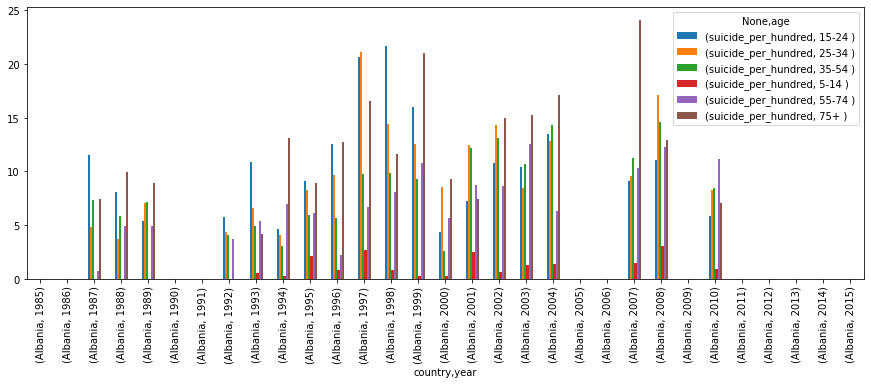

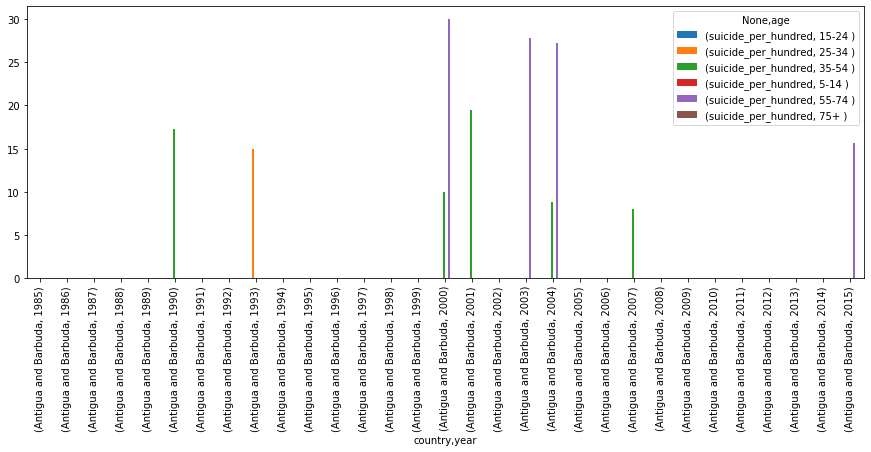

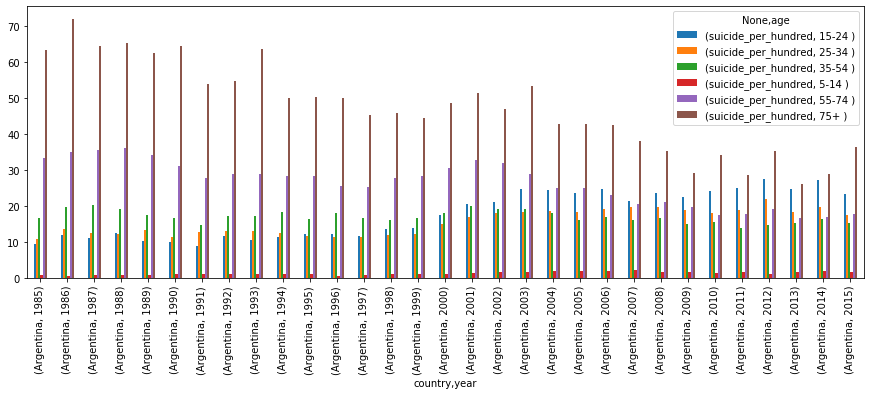

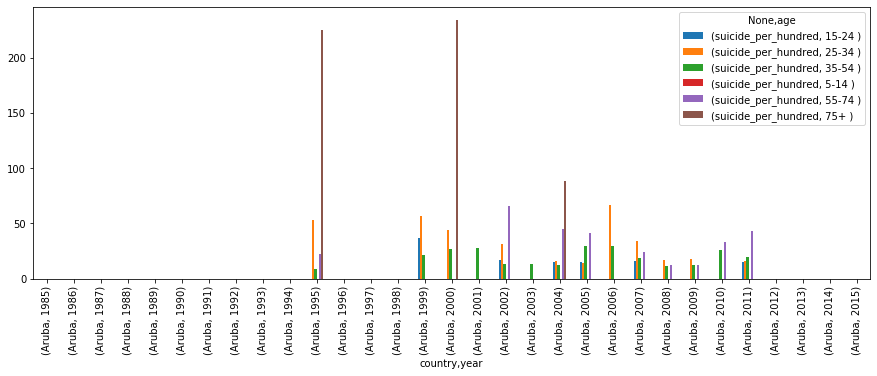

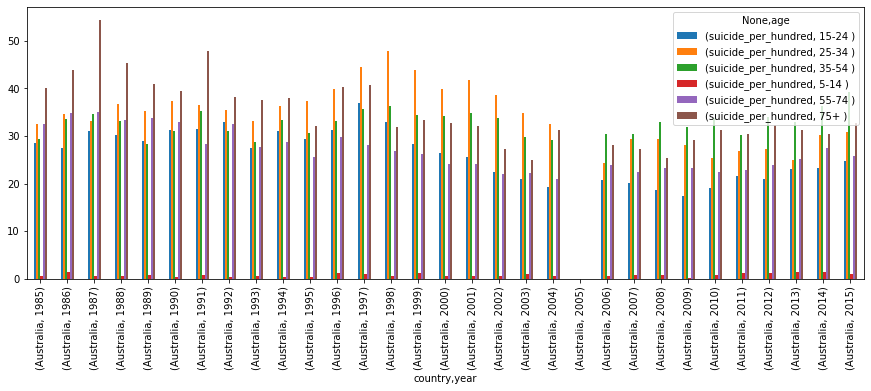

...

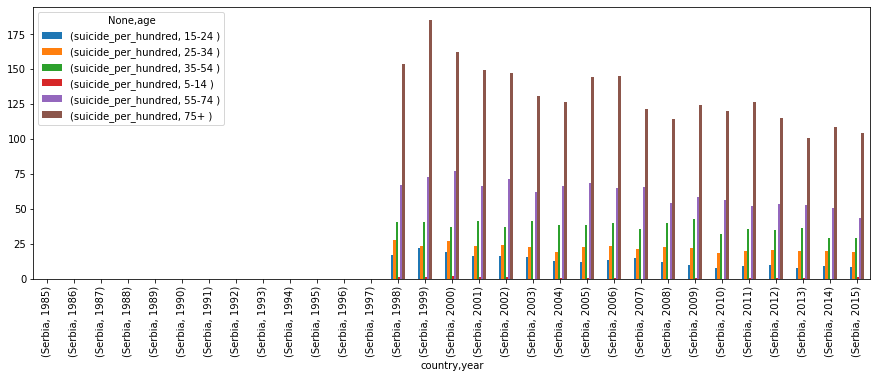

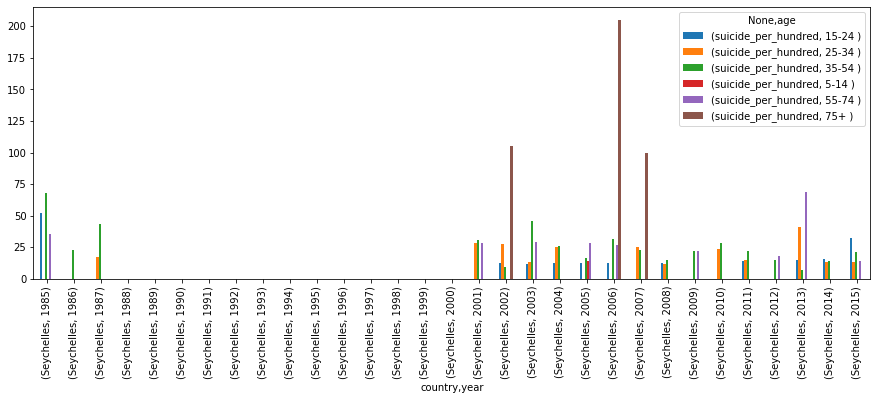

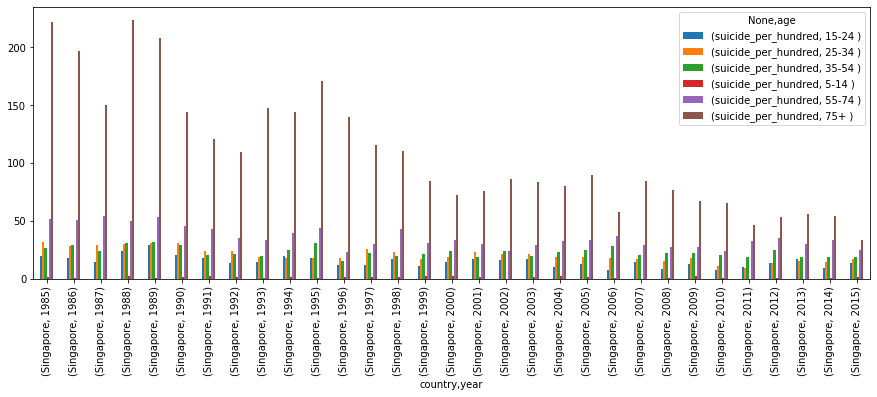

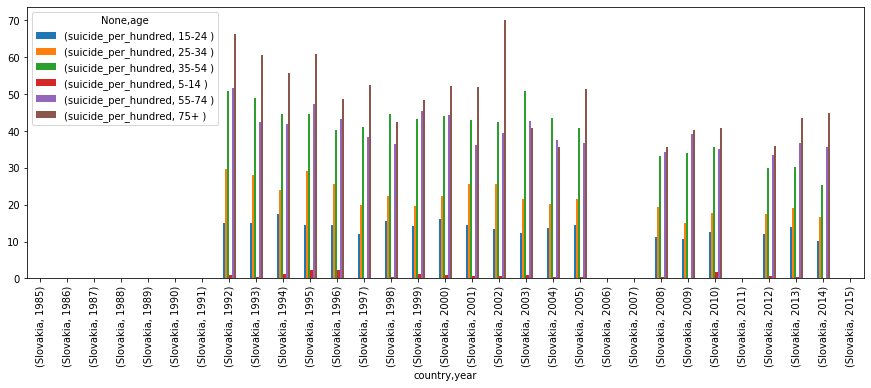

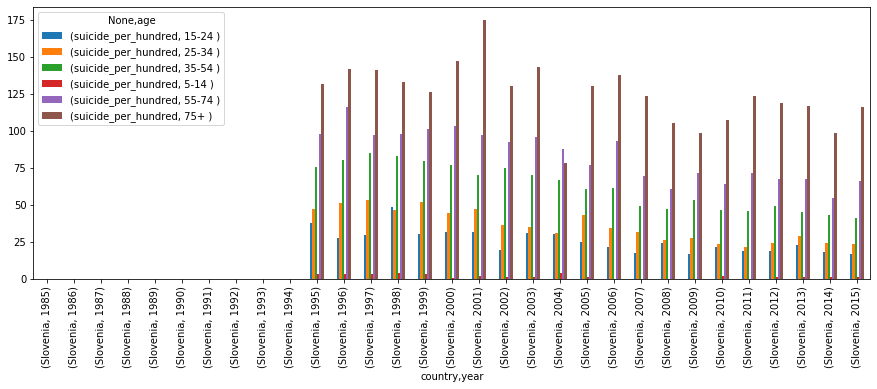

In [54]:
age_grouped = pd.DataFrame(database, columns = ['country', 'year', 'age', 'suicide_per_hundred'])
age_grouped = age_grouped.groupby(['country','year','age',]).sum().unstack(fill_value = 0)

k = age_grouped.count()
k = k[0]
prev = 'Albania'
starting = 0
ending = 0
for i in range(k):
    if prev != age_grouped.index[i][0]:
        db2 = age_grouped.iloc[starting:ending]
        db2.plot.bar(figsize=(15,5))
        plt.show()
        starting = ending
    ending += 1
    prev = age_grouped.index[i][0]

In [55]:
database.to_csv('clean_suicide.csv')